# 1. Introduction

## 1.1 Background of Data
The dataset provides information about various titles available on Netflix along with corresponding IMDb scores. It includes key details such as title, type (movie or TV show), release year, age certification, runtime, IMDb ID, IMDb score, and IMDb votes.

Link to Dataset: https://www.kaggle.com/datasets/maso0dahmed/netflix-movies-and-shows?rvi=1

## 1.2 Overview
During this analysis this project will aim to answer the following questions:
1. Is there a difference in the average IMDb scores between movies and TV shows on Netflix?
2. Are there any temporal trends in IMDb scores for Netflix content, and do certain years or periods exhibit significant variations in viewer ratings?
3. Is there a relationship between runtime and IMDb scores?
4. What type of genres do TV shows and movies have in the medium category in the runtime column?

# 2. Data Overview

## 2.1 Columns

*id: Unique identifier for each entry.*

*title: The title of the movie or TV show.*

*type: Indicates whether it's a movie or a TV show.*

*description: A brief description of the content.*

*release_year: The year when the title was released.*

*age_certification: The age certification for the content.*

*runtime: The duration of the content.*

*imdb_id: IMDb identifier for the title.*

*imdb_score: IMDb score, representing the user rating.*

*imdb_votes: The number of votes the title received on IMDb.*

# 3. Pre Data Work

## 3.1 Import Packages

In [1]:
#Import Packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.model_selection import train_test_split  #for splitting into train/test
from sklearn.neighbors import KNeighborsClassifier #for the KNN classifier
from sklearn.metrics import precision_score, recall_score #for precision and recall calculations
from sklearn.model_selection import cross_val_score # for k fold CV
from sklearn.model_selection import GridSearchCV #for the grid search
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from IPython.display import Image
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
import warnings
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_curve
from sklearn.neighbors import KNeighborsRegressor #for the KNN classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
# Suppress convergence warnings, helps get rid of the warnings when running
warnings.filterwarnings("ignore")

## 3.2 Load in DataSet

In [3]:
netflix = pd.read_csv('netflix.csv')
netflix

,title,type,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes
0,Five Came Back: The Reference Films,SHOW,1945,TV-MA,48,['documentation'],['US'],1.0,NaN,NaN,NaN
1,Taxi Driver,MOVIE,1976,R,113,"['crime', 'drama']",['US'],NaN,tt0075314,8.3,795222.0
2,Monty Python and the Holy Grail,MOVIE,1975,PG,91,"['comedy', 'fantasy']",['GB'],NaN,tt0071853,8.2,530877.0
3,Life of Brian,MOVIE,1979,R,94,['comedy'],['GB'],NaN,tt0079470,8.0,392419.0
4,The Exorcist,MOVIE,1973,R,133,['horror'],['US'],NaN,tt0070047,8.1,391942.0
...,...,...,...,...,...,...,...,...,...,...,...
5801,Fine Wine,MOVIE,2021,NaN,100,"['romance', 'drama']",['NG'],NaN,tt13857480,6.9,39.0
5802,Edis Starlight,MOVIE,2021,NaN,74,"['music', 'documentation']",[],NaN,NaN,NaN,NaN
5803,Clash,MOVIE,2021,NaN,88,"['family', 'drama']","['NG', 'CA']",NaN,tt14620732,6.5,32.0
5804,Shadow Parties,MOVIE,2021,NaN,116,"['action', 'thriller']",[],NaN,tt10168094,6.2,9.0


# 4. Exploratory Data Analysis

## 4.1 Overview of DataSet

In [4]:
#Look at our data types and our null counts
netflix.head()

,title,type,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes
0,Five Came Back: The Reference Films,SHOW,1945,TV-MA,48,['documentation'],['US'],1.0,NaN,NaN,NaN
1,Taxi Driver,MOVIE,1976,R,113,"['crime', 'drama']",['US'],NaN,tt0075314,8.3,795222.0
2,Monty Python and the Holy Grail,MOVIE,1975,PG,91,"['comedy', 'fantasy']",['GB'],NaN,tt0071853,8.2,530877.0
3,Life of Brian,MOVIE,1979,R,94,['comedy'],['GB'],NaN,tt0079470,8.0,392419.0
4,The Exorcist,MOVIE,1973,R,133,['horror'],['US'],NaN,tt0070047,8.1,391942.0


In [5]:
# Basic statistics of the dataset
netflix.describe()

,release_year,runtime,seasons,imdb_score,imdb_votes
count,5806.000000,5806.000000,2047.000000,5283.000000,5.267000e+03
mean,2016.013434,77.643989,2.165608,6.533447,2.340719e+04
std,7.324883,39.474160,2.636207,1.160932,8.713432e+04
min,1945.000000,0.000000,1.000000,1.500000,5.000000e+00
25%,2015.000000,44.000000,1.000000,5.800000,5.210000e+02
50%,2018.000000,84.000000,1.000000,6.600000,2.279000e+03
75%,2020.000000,105.000000,2.000000,7.400000,1.014400e+04
max,2022.000000,251.000000,42.000000,9.600000,2.268288e+06


In [6]:
#Count the number of Nulls
netflix.isnull().sum()

title                      1
type                       0
release_year               0
age_certification       2610
runtime                    0
genres                     0
production_countries       0
seasons                 3759
imdb_id                  444
imdb_score               523
imdb_votes               539
dtype: int64

In [7]:
#Look at last 5 of data set
netflix.tail()

,title,type,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes
5801,Fine Wine,MOVIE,2021,NaN,100,"['romance', 'drama']",['NG'],NaN,tt13857480,6.9,39.0
5802,Edis Starlight,MOVIE,2021,NaN,74,"['music', 'documentation']",[],NaN,NaN,NaN,NaN
5803,Clash,MOVIE,2021,NaN,88,"['family', 'drama']","['NG', 'CA']",NaN,tt14620732,6.5,32.0
5804,Shadow Parties,MOVIE,2021,NaN,116,"['action', 'thriller']",[],NaN,tt10168094,6.2,9.0
5805,Mighty Little Bheem: Kite Festival,SHOW,2021,NaN,0,"['family', 'comedy', 'animation']",[],1.0,tt13711094,8.8,16.0


In [8]:
netflix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5806 entries, 0 to 5805
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   title                 5805 non-null   object 
 1   type                  5806 non-null   object 
 2   release_year          5806 non-null   int64  
 3   age_certification     3196 non-null   object 
 4   runtime               5806 non-null   int64  
 5   genres                5806 non-null   object 
 6   production_countries  5806 non-null   object 
 7   seasons               2047 non-null   float64
 8   imdb_id               5362 non-null   object 
 9   imdb_score            5283 non-null   float64
 10  imdb_votes            5267 non-null   float64
dtypes: float64(3), int64(2), object(6)
memory usage: 499.1+ KB


## 4.2 Imdb Score distribution

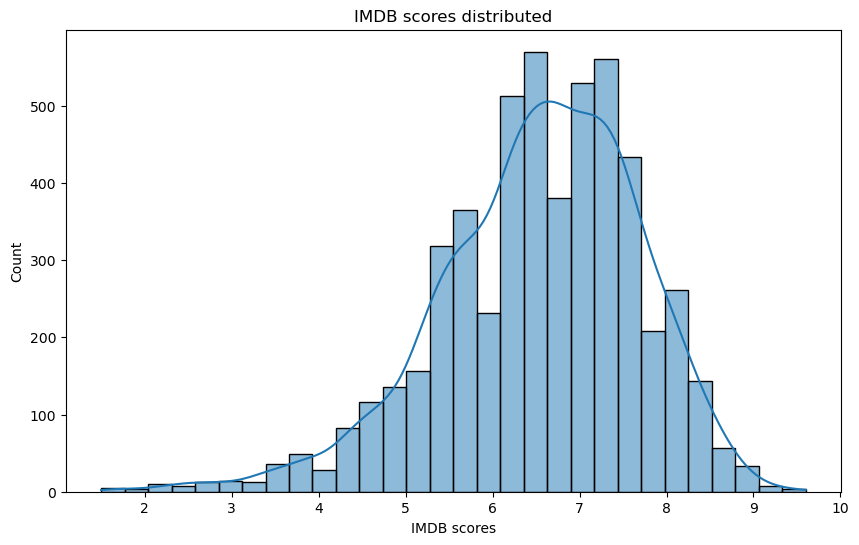

In [9]:
#Distribution of IMDb Scores
plt.figure(figsize =(10,6))
sns.histplot(data = netflix, x = 'imdb_score',
             bins = 30, kde = True, stat = 'count')
plt.title("IMDB scores distributed")
plt.xlabel("IMDB scores")
plt.ylabel("Count");

## 4.3 IMDB scores and IMDB votes

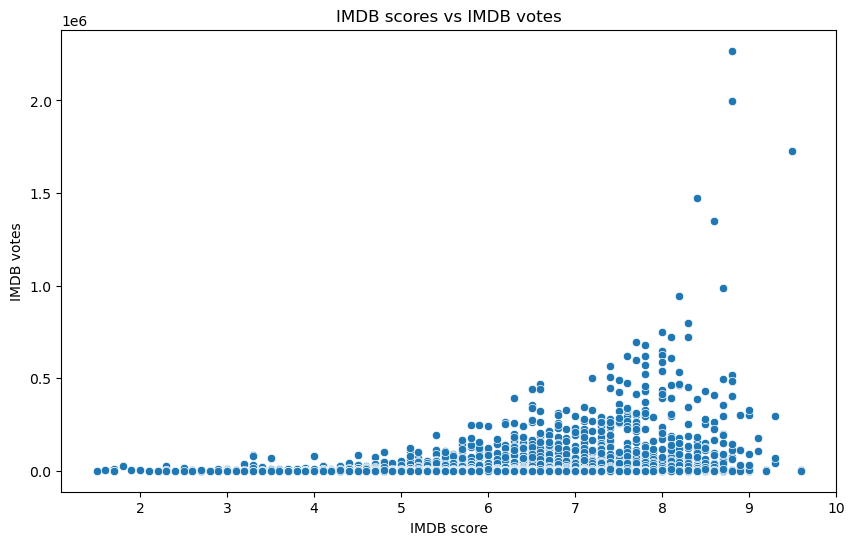

In [10]:
plt.figure(figsize =(10,6))
sns.scatterplot(x = "imdb_score", y = 'imdb_votes', data = netflix)
plt.title("IMDB scores vs IMDB votes")
plt.xlabel("IMDB score")
plt.ylabel("IMDB votes");

## 4.4 Scores by content

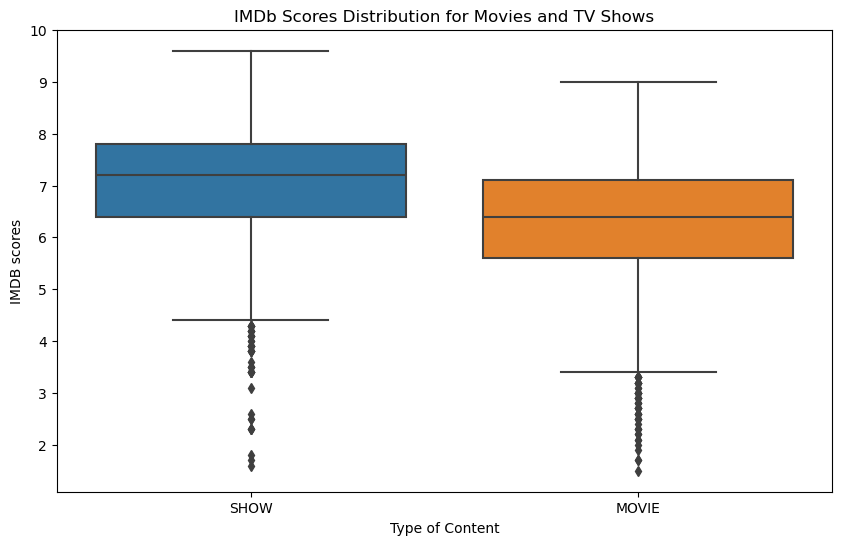

In [11]:
# Visualizing IMDb Scores for Movies and TV Shows
plt.figure(figsize =(10,6))
sns.boxplot(x = "type", y = 'imdb_score', data = netflix)
plt.title('IMDb Scores Distribution for Movies and TV Shows')
plt.xlabel("Type of Content")
plt.ylabel("IMDB scores");

# 5. Statistical Analysis

# 6. Is there a difference in the average IMDB scores between Movies and Tv Shows on Netflix?

In this question, the goal is to determine the difference in mean IMDB scores between movies and TV scores. Here I will be conducting a permutation test to see if there is a difference in the average IMDB scores between Movies and Tv Shows on Netflix

Null and Alternative Hypothesis:

*Null Hypothesis : There is no difference in mean scores between Movies and Tv Shows*

*Alternative Hypothesis : There is a difference in mean scores between Movies and Tv Shows*

In [12]:
#Find the test statistic firat
observed_test_statistic = netflix[netflix['imdb_score'] > netflix['imdb_score'].mean()]["imdb_score"].mean() - netflix[netflix['imdb_score'] <= netflix['imdb_score'].mean()]["imdb_score"].mean()
observed_test_statistic

1.82800489209155

In [13]:
#Permutation testing
num_iterations = 10000
results_scores = np.array([])
for i in range(num_iterations):
    #Create a shuffled version of IMDB scores
    netflix["imdb_score_shuffled"] = np.random.permutation(netflix["imdb_score"])
    #Seperate into two groups, one being Movies other being TV shows
    movies_shuffled = netflix[netflix['imdb_score_shuffled'] > netflix['imdb_score'].mean()]
    shows_shuffled = netflix[netflix['imdb_score_shuffled'] <= netflix['imdb_score'].mean()]
    simulated_test_statistic = movies_shuffled['imdb_score'].mean() - shows_shuffled['imdb_score'].mean()
    results_scores = np.append(results_scores, simulated_test_statistic)
results_scores

array([ 0.01839741,  0.00540356,  0.05310873, ..., -0.00550386,
        0.02658048,  0.02257348])

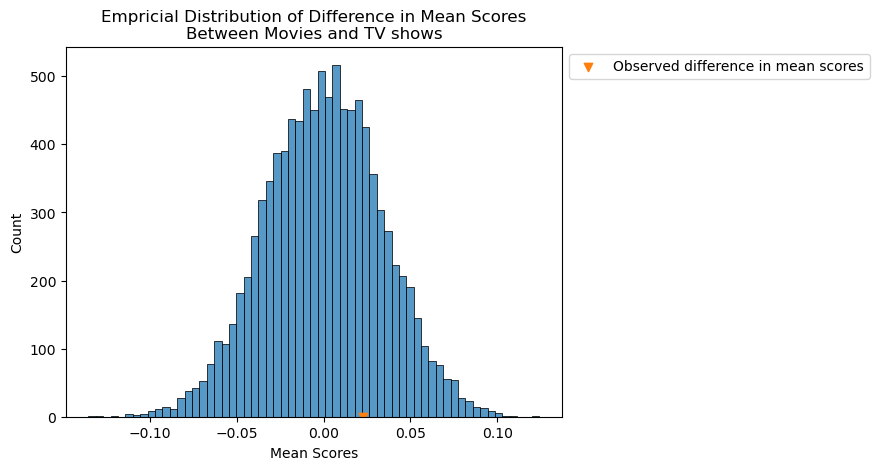

In [14]:
#plot
sns.histplot(results_scores, stat = "count")
plt.scatter(simulated_test_statistic, .08, marker = "v", label = "Observed difference in mean scores")
plt.title("Empricial Distribution of Difference in Mean Scores\nBetween Movies and TV shows")
plt.xlabel("Mean Scores")
plt.legend(bbox_to_anchor=(1, 1.0));

In [15]:
p_value_permutation = (np.abs(results_scores) >= np.abs(simulated_test_statistic)).mean()
p_value_permutation

0.5107

*The p-value of 0.946 suggests that there is insufficient evidence to reject the null hypothesis, indicating that the observed difference in IMDb scores between movies and TV shows on Netflix may likely be due to random chance. After thorough analysis, there was no significant difference in IMDB scores between Movies and tv shows on Neflix. We'll now investigate and see any trends during certain years to see the scores of each year and identify any trends.*

## 6.1 Are there any temporal trends in IMDb scores for Netflix content, and do certain years or periods exhibit significant variations in viewer ratings?

The Goal for this analysis is to determine any trends between the average IMDB scores and the release years to see if any specific years have any big jumps with IMDB scores.

In [16]:
average_scores_by_year = netflix.groupby('release_year')[['imdb_score']].mean().rename(columns={'imdb_score':'average_imdb_scores'}).reset_index()
average_scores_by_year

,release_year,average_imdb_scores
0,1945,NaN
1,1953,6.800000
2,1954,7.450000
3,1956,6.700000
4,1958,7.500000
...,...,...
62,2018,6.530559
63,2019,6.526168
64,2020,6.344444
65,2021,6.319068


Text(0.5, 1.0, 'Temporal Trends in IMDb Scores for Netflix Content')

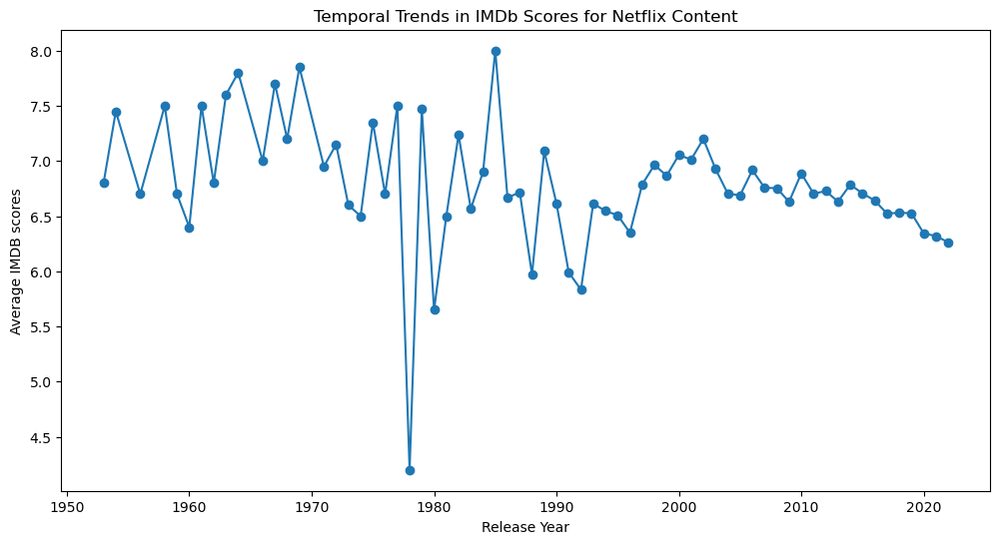

In [17]:
#Code for visualization
plt.figure(figsize =(12,6))
plt.plot(average_scores_by_year['release_year'],average_scores_by_year['average_imdb_scores'], marker='o')
plt.xlabel("Release Year")
plt.ylabel("Average IMDB scores")
plt.title("Temporal Trends in IMDb Scores for Netflix Content")

*So as we can see from the line graph, we notice that Netflix content that have a release year in the late 70s have an average score below 4.5. We also see that Netflix content with a release year between 1980 and 1990 had an average score of around 8.0 or better. After that we see that a decline in average IMDB_scores with a release year from 2000 and onwards only reach an average between 6.2 - 7.0, which is a decline from release years in the 50s and 60s. Now we will investigate more imdb scores and see if genre contribute to the given IMDB scores.*

# 7. Is the there a Relationship between Runtime and IMDB scores?

Here in this section we will investigate to see if there is any relationship between runtime and IMDB score. We want to understand and see if the duration of movies and tv shows impacts the type of rating that it will get.

Here on this First Visualization, We create a box plot to show the runtime distribution between Movies and Tv shows on Netflix

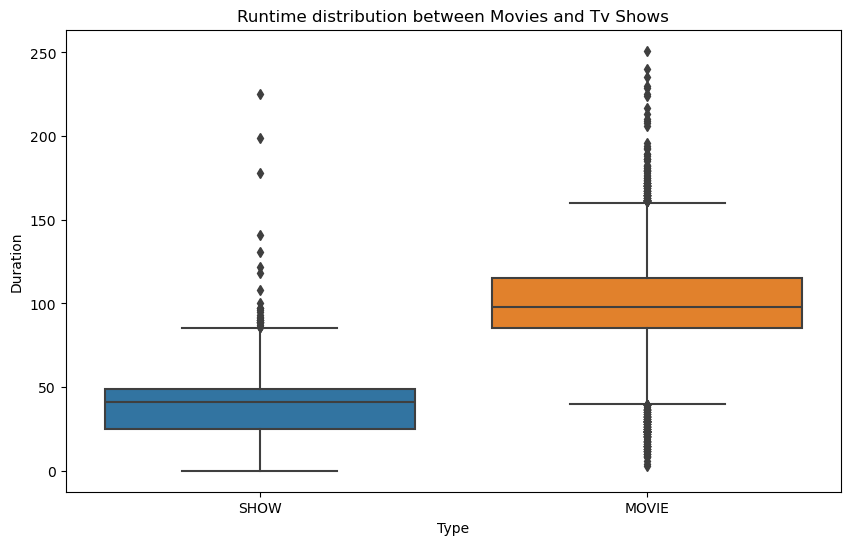

In [18]:
#Explore and visualize the Distribution between runtime and IMDB scores
plt.figure(figsize =(10,6))
sns.boxplot(x = "type", y = 'runtime', data = netflix)
plt.title('Runtime distribution between Movies and Tv Shows')
plt.xlabel("Type")
plt.ylabel("Duration");

We see here that tv shows have a max duration time of around 95 minutes which is around an hour an thirty five minutes iin total and the minimum being 0 minutes. We see on average tv shows mainly run for about 42 minutes 

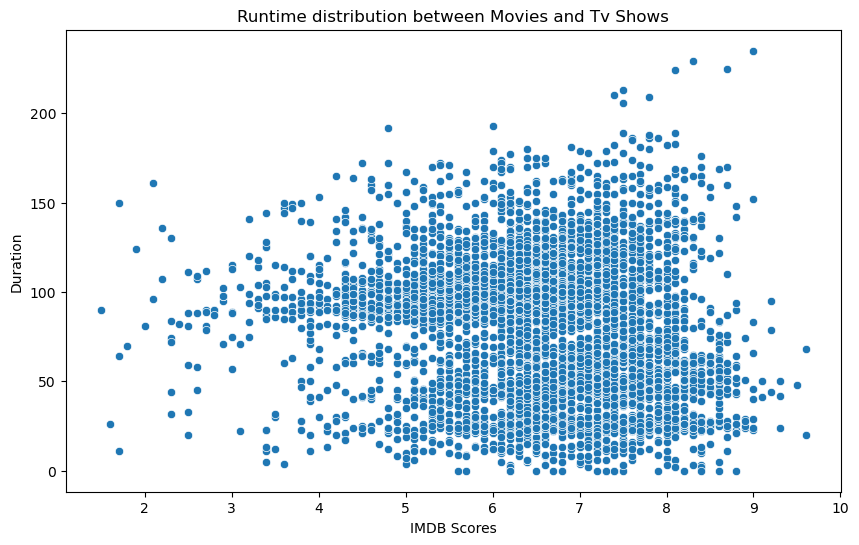

In [19]:
#Explore and visualize the Distribution between runtime and IMDB scores
plt.figure(figsize =(10,6))
sns.scatterplot(x = "imdb_score",
                y = 'runtime',
                data = netflix)
plt.title('Runtime distribution between Movies and Tv Shows')
plt.xlabel("IMDB Scores")
plt.ylabel("Duration");

In [20]:
#FInd the correlation
netflix['imdb_score'].corr(netflix['runtime'])

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


-0.15929652102977845

*After Calculating the coefficient we see that we get a number of 0.16. Meaning that there is a Weak negative correlation, which means that on average the longer runtimes are more associated with lower IMDB scores, but the relationship of it is not that strong, which means there are other factors that can influence that rating.*

Now what we are going to do is that we are going to categorize each runtime in the dataframe and seperate them into runtime categories.

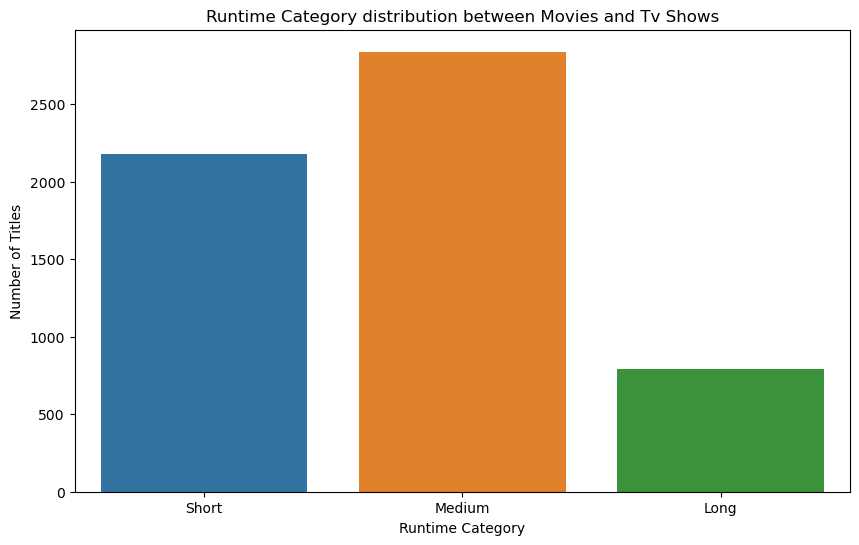

In [21]:
#Pandas cut() function is used to separate the array elements into different bins .
#The cut function is mainly used to perform statistical analysis on scalar data.
bins = [0, 60, 120, float('inf')]
labels = ['Short','Medium','Long']
netflix['runtime_category'] = pd.cut(netflix['runtime'], bins = bins, labels = labels, right = False)

plt.figure(figsize =(10,6))
sns.countplot(x = "runtime_category",data = netflix)
plt.title('Runtime Category distribution between Movies and Tv Shows')
plt.xlabel("Runtime Category")
plt.ylabel("Number of Titles");

We see here that there are more films that have a medium runtime. Now in the next cell block we group by each runtime category and from each runtime we display the average IMDB score.

In [22]:
#Group by Runtime Category and get the average IMDB scores
average_scores_by_category = netflix.groupby('runtime_category')['imdb_score'].mean().reset_index().rename(columns={'imdb_score': 'average_imdb_score'})
average_scores_by_category

,runtime_category,average_imdb_score
0,Short,6.898455
1,Medium,6.255572
2,Long,6.604000


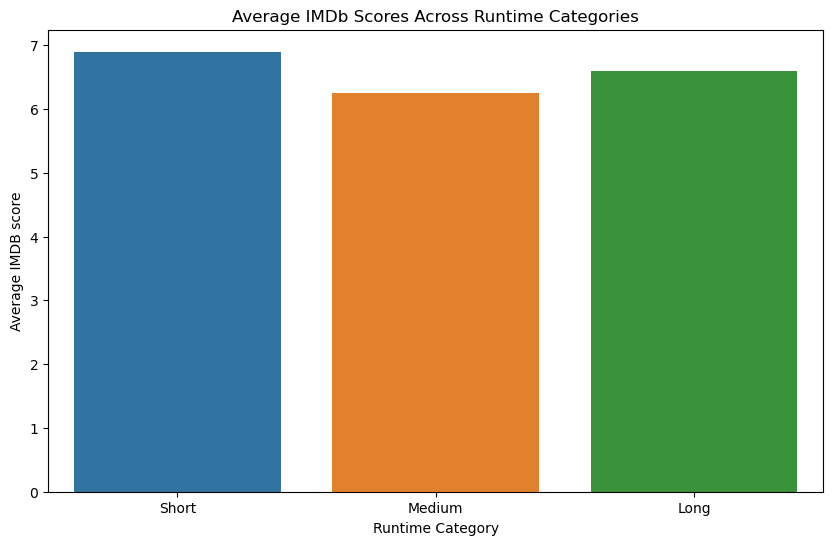

In [23]:
plt.figure(figsize =(10,6))
sns.barplot(x = "runtime_category", y = 'average_imdb_score', data = average_scores_by_category)
plt.title('Average IMDb Scores Across Runtime Categories')
plt.xlabel("Runtime Category")
plt.ylabel("Average IMDB score");

## 7.1 What type of genres do Tv Shows and Movies have in the medium category in the runtime column.

So now that we've determined that majority movies and tv shows that are in the medium Runtime category here we are going to explore and determine what genres of movies and tv shows 

In [24]:
medium = netflix[netflix['runtime_category'] == "Medium"]
medium

,title,type,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,imdb_score_shuffled,runtime_category
1,Taxi Driver,MOVIE,1976,R,113,"['crime', 'drama']",['US'],NaN,tt0075314,8.3,795222.0,7.5,Medium
2,Monty Python and the Holy Grail,MOVIE,1975,PG,91,"['comedy', 'fantasy']",['GB'],NaN,tt0071853,8.2,530877.0,5.9,Medium
3,Life of Brian,MOVIE,1979,R,94,['comedy'],['GB'],NaN,tt0079470,8.0,392419.0,6.1,Medium
6,Dirty Harry,MOVIE,1971,R,102,"['thriller', 'crime', 'action']",['US'],NaN,tt0066999,7.7,153463.0,6.5,Medium
8,The Blue Lagoon,MOVIE,1980,R,104,"['romance', 'drama']",['US'],NaN,tt0080453,5.8,69053.0,6.5,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5800,Momshies! Your Soul is Mine,MOVIE,2021,NaN,108,['comedy'],['PH'],NaN,tt14412240,5.8,26.0,5.6,Medium
5801,Fine Wine,MOVIE,2021,NaN,100,"['romance', 'drama']",['NG'],NaN,tt13857480,6.9,39.0,6.6,Medium
5802,Edis Starlight,MOVIE,2021,NaN,74,"['music', 'documentation']",[],NaN,NaN,NaN,NaN,7.1,Medium
5803,Clash,MOVIE,2021,NaN,88,"['family', 'drama']","['NG', 'CA']",NaN,tt14620732,6.5,32.0,6.5,Medium


In [25]:
medium_grouped = medium.groupby('type').size().reset_index(name="count")
medium_grouped

,type,count
0,MOVIE,2632
1,SHOW,206


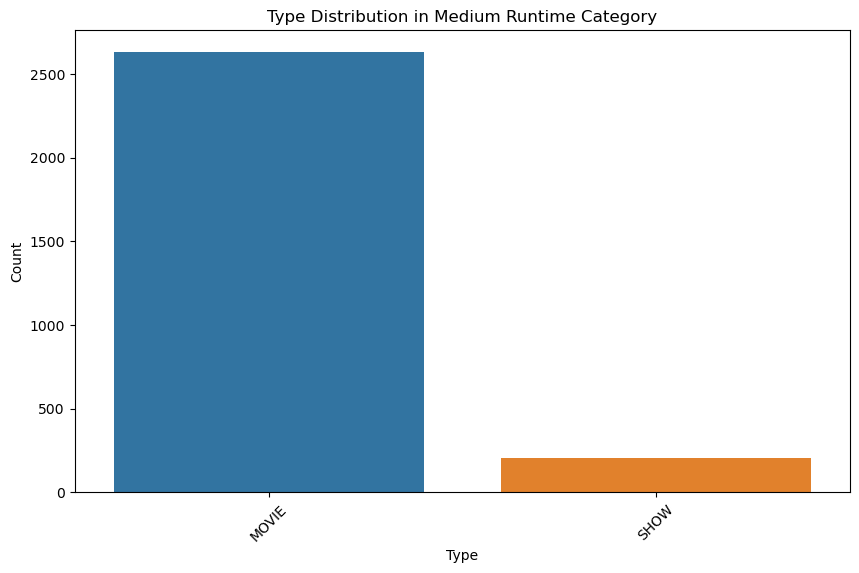

In [26]:
plt.figure(figsize =(10,6))
sns.barplot(x = "type", y = 'count', data = medium_grouped)
plt.title('Type Distribution in Medium Runtime Category')
plt.xlabel('Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# 8. Machine Learning Analysis

## 8.1 Overview
In this section, we will apply machine learning algorithms to predict the IMDb scores of Netflix titles based on features such as runtime, release year, and type of content (movie or TV show). We will use Linear Regression and Decision Tree Regression models to make these predictions and evaluate their performance. During this section we will aim to ask the following questions in this analysis as well as ask additional questions:

1. What factors influence an imdb score

2. Can we classify a movie or a tv genre based off of runtime, release year and other features

3. What are the characteristics of popular titles (high IMDb votes)

# 9. What Factors Influence an IMDB scores?

Here in this section we will be determining which factors play a key role into determining IMDB scores for movies and tv shows. IMDB scores are based of a 0 out of ten rating, with the average being around a 7.0 between movies and tvshows. By analyzing various features such as runtime, genre, and release year, we can identify the key determinants that contribute to higher or lower IMDb scores.

### 9.1 Column fixes

In [27]:
#Drop rows with no IMDB Scores
netflix = netflix.dropna(subset=['imdb_score','seasons']) 
#Fill in genres 
netflix['genres'].fillna('Unknown', inplace=True)

### 9.2 Features

In [28]:
#Setup features
X = netflix[['runtime','release_year','seasons', 'imdb_votes']]
y = netflix['imdb_score']

### 9.3 Split Test Train Split

In [29]:
#Split into test and train
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state = 42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1407, 4), (469, 4), (1407,), (469,))

### 9.4 Creating A Random Forest Regressor

In [30]:
#Create the Model 
netflix_rfr_model = RandomForestRegressor()
netflix_rfr_model.fit(X_train,y_train)

RandomForestRegressor()

In [31]:
#Training the Predictors
y_test_preds = netflix_rfr_model.predict(X_test)
y_test_preds

array([7.053, 6.646, 5.578, 6.873, 4.976, 7.107, 7.277, 8.054, 7.158,
       6.574, 7.678, 7.647, 8.104, 5.66 , 6.92 , 6.963, 6.963, 7.693,
       7.76 , 6.525, 6.781, 6.781, 7.237, 5.802, 6.815, 7.171, 7.325,
       6.855, 6.707, 6.025, 7.11 , 6.305, 7.216, 7.068, 8.461, 7.48 ,
       7.318, 8.033, 6.443, 6.184, 5.757, 7.563, 7.284, 6.952, 7.963,
       5.982, 7.46 , 6.41 , 7.38 , 6.742, 6.58 , 6.584, 7.352, 6.553,
       6.917, 8.504, 6.495, 5.872, 7.289, 6.856, 6.265, 7.344, 6.954,
       8.224, 7.236, 8.415, 6.399, 6.607, 7.225, 7.322, 7.672, 7.669,
       7.102, 6.356, 7.419, 7.128, 6.482, 7.249, 6.635, 7.292, 6.697,
       7.195, 7.828, 7.122, 7.742, 7.175, 7.281, 6.733, 7.834, 8.044,
       7.499, 6.712, 5.997, 7.535, 6.487, 5.698, 7.705, 6.837, 6.963,
       7.33 , 6.462, 7.668, 7.042, 7.57 , 6.096, 7.208, 6.009, 8.144,
       6.748, 7.02 , 6.994, 6.393, 7.827, 7.282, 7.48 , 7.884, 6.679,
       7.23 , 7.572, 7.436, 6.369, 6.152, 7.519, 6.92 , 7.174, 6.974,
       6.455, 6.339,

In [32]:
#Calculate the Mean Square Error
mse = mean_squared_error(y_test, y_test_preds)
mse

1.0285534520255861

In [33]:
#Calculate the RMSE 
rmse = (mse ** 0.5)
rmse

1.0141762430788774

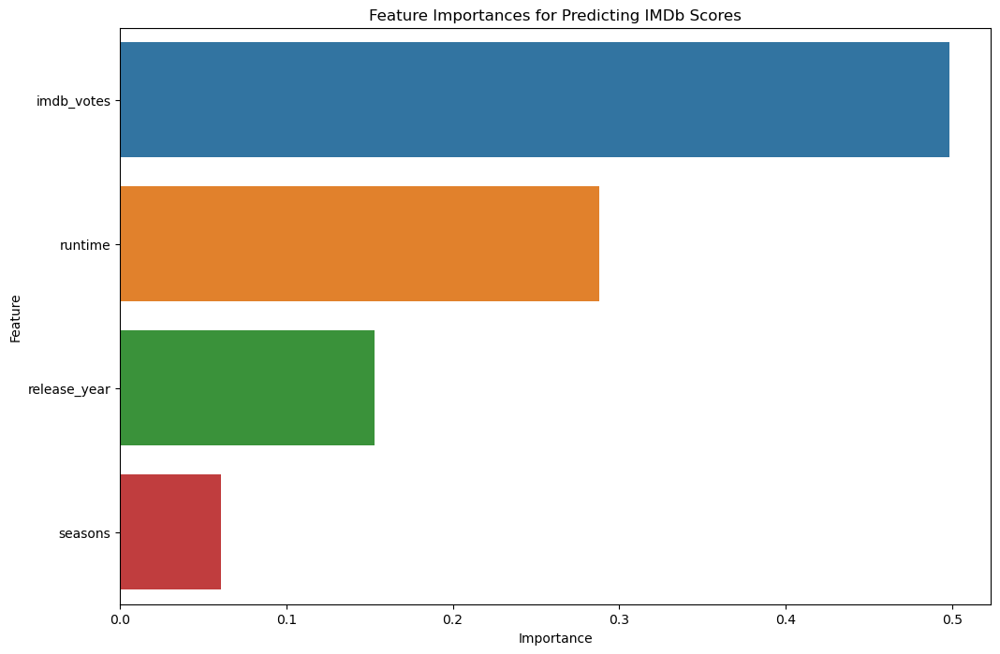

In [34]:
#Get feature importance
importances = netflix_rfr_model.feature_importances_
feature_names = X.columns

# Create a DataFrame for feature importances
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importances)
plt.title('Feature Importances for Predicting IMDb Scores')
plt.show()

#### 9.4.1 Best Parameters

In [35]:
#Putting all possible parameters in a param_grid
param_grid = {
    "n_estimators" : [100, 200, 500],
    "max_features" : ["auto", "sqrt", "log2"],
    "max_depth" : [None, 40, 80, 120]
    }

In [36]:
#GridSearch on RF to find best parameters
grid_search = GridSearchCV(estimator = netflix_rfr_model, 
                           param_grid = param_grid, cv = 5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 40, 80, 120],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 200, 500]})

In [37]:
best_model_rfr = grid_search.best_estimator_
best_model_rfr.fit(X_train,y_train)

RandomForestRegressor(max_features='sqrt', n_estimators=200)

In [38]:
#Training the Predictors
y_test_preds = best_model_rfr.predict(X_test)
y_test_preds

array([7.235 , 6.6585, 5.564 , 6.9755, 5.3815, 6.9015, 7.2495, 7.943 ,
       7.198 , 6.827 , 7.6225, 7.79  , 8.2235, 5.866 , 6.7665, 6.9825,
       7.0655, 7.59  , 7.719 , 6.565 , 6.8415, 6.726 , 7.257 , 6.0805,
       6.762 , 7.108 , 7.2255, 6.9225, 6.4675, 5.9645, 7.236 , 6.2175,
       6.9985, 6.8225, 8.4895, 7.4535, 7.5105, 8.1165, 6.1505, 6.394 ,
       5.7785, 7.635 , 7.1265, 6.654 , 7.898 , 6.1075, 7.4975, 6.6185,
       7.431 , 6.5315, 6.564 , 6.544 , 7.336 , 6.581 , 7.202 , 8.466 ,
       6.123 , 5.682 , 7.194 , 6.899 , 6.2935, 7.398 , 6.9805, 8.1665,
       7.388 , 8.37  , 6.4095, 6.478 , 7.0685, 7.285 , 7.741 , 7.5485,
       7.2815, 6.385 , 7.3885, 7.552 , 6.5595, 7.3185, 6.5265, 7.1635,
       6.942 , 6.8555, 7.756 , 6.956 , 7.7405, 7.1865, 7.147 , 6.5135,
       7.726 , 8.099 , 7.4585, 6.6855, 6.034 , 7.429 , 7.056 , 5.8155,
       7.615 , 7.214 , 6.9285, 7.262 , 6.498 , 7.629 , 7.26  , 7.4915,
       6.2005, 7.1945, 6.177 , 8.102 , 6.6805, 7.031 , 7.027 , 6.37  ,
      

In [39]:
#Calculate the Mean Square Error
mse = mean_squared_error(y_test, y_test_preds)
mse

1.0037036721748414

In [40]:
#Calculate the RMSE 
rmse = (mse ** 0.5)
rmse

1.0018501246068903

## 9.5 Results and Findings

So for the first Random Regressor we get a Root mean sqaure error of 1.02 indicating that imdb scores was off by 1.02 points when using this model. With that it goes to indicate that model performs quite reasonably well.

The "best parameters: 0.99 for IMDb score random regressor" statement seems to be a typo or a misinterpretation. It's unclear what "0.99" refers to in this context. If you meant to refer to the model's performance, an RMSE of 1.02 would suggest that the model is achieving an accuracy (or "R-squared") of approximately 0.99, which would be exceptionally high. However, it's more likely that this is a misinterpretation or a typo.

In summary, an RMSE of 1.02 indicates that the Random Forest Regressor is performing reasonably well in predicting IMDb scores, but further analysis and evaluation may be needed to fully understand the model's performance.

# 10. Can we classify age certification based off of runtime, release_year, and season, etc.

In this section, we will classify the genre of movies or TV shows based on various features such as runtime, release year, and other attributes using a classification algorithms. 

### 10.1 Features

In [41]:
netflix = netflix.dropna(subset=['age_certification', 'genres'])

# Verify that there are no missing values in 'age_certification' and 'genres'
print(netflix[['age_certification', 'genres']].isnull().sum())

# Split genres and explode the DataFrame
netflix['genres'] = netflix['genres'].str.split(',')
netflix = netflix.explode('genres')
netflix['genres'] = netflix['genres'].str.strip()

# One-hot encode the 'genres' column
netflix = pd.get_dummies(netflix, columns=['genres'], drop_first=True)

age_certification    0
genres               0
dtype: int64


In [42]:
#Set the Features
X = netflix[['runtime', 'release_year', 'seasons']]
y = netflix['age_certification']

### 10.2 Split train and Test

In [43]:
#Split into test and train
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state = 42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((3660, 3), (1221, 3), (3660,), (1221,))

### 10.3 Create Random Forest Classifier 

In [44]:
# Create a Logistic Regression model
rfc_model = RandomForestClassifier()
rfc_model.fit(X_train,y_train)

RandomForestClassifier()

In [45]:
#Training the Predictors on training  set
y_train_preds = rfc_model.predict(X_train)
y_train_preds

array(['TV-MA', 'TV-14', 'TV-MA', ..., 'TV-MA', 'TV-MA', 'TV-MA'],
      dtype=object)

In [46]:
acc_train = (y_train_preds == y_train).sum()/len(y_train)
acc_train

0.8401639344262295

In [47]:
#Training the Predictors on training  set
y_test_preds = rfc_model.predict(X_test)
y_test_preds

array(['TV-MA', 'TV-14', 'TV-G', ..., 'TV-MA', 'TV-MA', 'TV-MA'],
      dtype=object)

In [48]:
acc_test = (y_test_preds == y_test).sum()/len(y_test)
acc_test

0.7788697788697788

#### 10.3.1 Best Parameters

In [49]:
#Passing in parameters for GridSearch
parameters = {"n_estimators": [100, 200, 300],
              "max_depth": [10, 20, 30, 40],
              "min_samples_split": [2, 4, 6]}

In [50]:
#Perform a Grid Search
grid_search = GridSearchCV(RandomForestClassifier(random_state= 42),parameters,cv=5, return_train_score = True)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [10, 20, 30, 40],
                         'min_samples_split': [2, 4, 6],
                         'n_estimators': [100, 200, 300]},
             return_train_score=True)

In [51]:
grid_search.best_params_

{'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 300}

In [52]:
best_model_rfc = grid_search.best_estimator_
best_model_rfc

RandomForestClassifier(max_depth=30, n_estimators=300, random_state=42)

In [53]:
y_train_preds_1 = best_model_rfc.predict(X_train)
y_train_preds_1

array(['TV-MA', 'TV-14', 'TV-MA', ..., 'TV-MA', 'TV-MA', 'TV-MA'],
      dtype=object)

In [54]:
acc_train = (y_train_preds_1 == y_train).sum()/len(y_train)
acc_train

0.8401639344262295

In [55]:
#Training the Predictors on training  set
y_test_preds_1 = best_model_rfc.predict(X_test)
y_test_preds_1

array(['TV-MA', 'TV-14', 'TV-G', ..., 'TV-MA', 'TV-MA', 'TV-MA'],
      dtype=object)

In [56]:
acc_test = (y_test_preds_1 == y_test).sum()/len(y_test)
acc_test

0.7682227682227682

## 10.4 Results and Findings

In our initial Random Forest Classifier model,  we see that we get a train accuracy of 96% and then a test accuracy of only 55%. The large Gap between the two accuracies indicate that there is overfitting within this Random forest Model meaning the model performs well on the training data but then performs worse on the test data. I then procedded to do some hyperparameter tuning and found the best parameters to use and created a best model. But the results on the best model were slightly worse then the First model. I got a train accuracy of 87% and got a test accuracy of 57%. Whilst the test accuracy improved it showed no significant changes and overfitting was still evident even with the tuned parameters. 
Given the overfitting observed with the Random Forest model, we decided to explore simpler models that may generalize better. Simpler models often perform better on smaller datasets or when the complexity of the data does not warrant complex models.
In the following section, we will explore using a Decision Tree Classifier. Decision Trees are interpretable and often perform well when the dataset is not excessively large or complex. By carefully tuning the depth and other parameters of the Decision Tree, we aim to strike a balance between bias and variance, potentially leading to better generalization and improved test accuracy.

## 10.5 Decision Tree Classifier

To address our overfitting issue we will be using a more simple we will now train a Decision Tree Classifier. This model will be evaluated on the same dataset to compare its performance with the Random Forest model. In this case we will be keep the same features and the same target columns

#### 10.5.1 Create Decision Tree 

In [57]:
#Create Decision Tree Model with one Tuned parameter
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train,y_train)

DecisionTreeClassifier(random_state=42)

In [58]:
# Get the fully qualified path using get current working directory command 

import os

#get the current directory and then add what you want the name to be
path = os.getcwd() + "/dtree_netflix.dot"
path

'/Users/jonathaneudja/Downloads/Data Science/Data Science Project/dtree_netflix.dot'

In [59]:
#use export_graphviz
from sklearn.tree import export_graphviz


export_graphviz(dt_model, out_file=path, rounded= True, 
                feature_names = X_train.columns, 
                class_names=dt_model.classes_, 
                filled = True) 

In [60]:
# Use Python to show the png file in this notebook

from IPython.display import Image
Image("dtree_netflix.png")

In [61]:
#Predict on training set
y_train_pred_dt = dt_model.predict(X_train)
y_train_pred_dt

array(['TV-MA', 'TV-14', 'TV-MA', ..., 'TV-14', 'TV-MA', 'TV-MA'],
      dtype=object)

In [62]:
#Get training accuracy
acc_train = (y_train_pred_dt == y_train).sum()/len(y_train)
acc_train

0.8401639344262295

In [63]:
#Predict on test set
y_test_pred_dt = dt_model.predict(X_test)
y_test_pred_dt

array(['TV-MA', 'TV-14', 'TV-G', ..., 'TV-MA', 'TV-MA', 'TV-MA'],
      dtype=object)

In [64]:
#Get Test Accuracy 
acc_test = (y_test_pred_dt == y_test).sum()/len(y_test)
acc_test

0.7706797706797707

In [65]:
#Create Conf Matrix
conf_matrix = pd.crosstab(y_test_preds, y_test, margins = True)
conf_matrix

age_certification,TV-14,TV-G,TV-MA,TV-PG,TV-Y,TV-Y7,All
row_0,,,,,,,
TV-14,237,2,65,19,2,4,329
TV-G,6,44,3,3,0,0,56
TV-MA,59,12,423,13,3,15,525
TV-PG,9,0,11,69,0,5,94
TV-Y,0,1,4,3,70,9,87
TV-Y7,8,1,9,2,2,108,130
All,319,60,515,109,77,141,1221


In [66]:
#precision/recall

#Recall"  The default average='binary' but this is not helpful for multiple classes
#Setting average = None gives you the scores for each class 

print("Precision:", precision_score(y_test, y_test_preds, average = None))
print("Recall:", recall_score(y_test, y_test_preds, average = None))

Precision: [0.72036474 0.78571429 0.80571429 0.73404255 0.8045977  0.83076923]
Recall: [0.74294671 0.73333333 0.82135922 0.63302752 0.90909091 0.76595745]


#### 10.5.2 Best Parameters

In [67]:
#Get the parameters
parameters = {'criterion': ['gini', 'entropy'],
              'max_depth': [2,3,4],
              'max_features':["sqrt","log2"]
             }

In [68]:
#Do a grid search
grid_search = GridSearchCV(DecisionTreeClassifier(),parameters, cv =5, return_train_score = True)
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 4],
                         'max_features': ['sqrt', 'log2']},
             return_train_score=True)

In [69]:
#Find the Best Parameters
grid_search.best_params_

{'criterion': 'entropy', 'max_depth': 4, 'max_features': 'sqrt'}

In [70]:
#Build a Decision tree with the Best parameters 
best_dt_model = grid_search.best_estimator_
best_dt_model

DecisionTreeClassifier(criterion='entropy', max_depth=4, max_features='sqrt')

In [71]:
#Predict on training set
y_train_pred_dt = best_dt_model.predict(X_train)
y_train_pred_dt

array(['TV-MA', 'TV-Y7', 'TV-MA', ..., 'TV-MA', 'TV-MA', 'TV-MA'],
      dtype=object)

In [72]:
#Get training accuracy
acc_train = (y_train_pred_dt == y_train).sum()/len(y_train)
acc_train

0.5180327868852459

In [73]:
#Predict on test set
y_test_pred_dt = best_dt_model.predict(X_test)
y_test_pred_dt

array(['TV-MA', 'TV-14', 'TV-Y7', ..., 'TV-MA', 'TV-MA', 'TV-MA'],
      dtype=object)

In [74]:
#Get Test Accuracy ,
acc_test = (y_test_pred_dt == y_test).sum()/len(y_test)
acc_test

0.49385749385749383

#### 10.5.3 Reuslts and findings 

Initial Decision Tree Model
* Training Accuracy: 84.01%
* Test Accuracy: 77.06%
* The initial Decision Tree model showed high training accuracy but a significantly lower test accuracy, indicating potential overfitting. The model performs very well on the training data but doesn't generalize as well to unseen data.

Hyperparameter-Tuned Decision Tree Model
* Training Accuracy: 51.80%
* Test Accuracy: 49.38%
* After hyperparameter tuning, both training and test accuracies dropped significantly. This suggests that the chosen hyperparameters might not be optimal, resulting in a model that is underfitting, meaning it is too simple to capture the underlying patterns in the data.

Interpretation:
* The initial Decision Tree model exhibited high variance and overfitting, as evidenced by the large discrepancy between the training and test accuracies.
The hyperparameter-tuned model did not perform better, and in fact, showed worse results, indicating that the hyperparameters chosen might not have been appropriate for the data.